In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from target_and_market.config import data_folder

## Import Data

In [2]:
user_analytics_raw = pd.read_csv(data_folder/'user_analytics.csv', index_col=0)
user_error = pd.read_csv(data_folder/'user_error_status.csv', index_col=0)
user_pro_status = pd.read_csv(data_folder/'user_pro_status.csv')
user_analytics_raw.head()

,user_id,sessions,last_session,total_eng_time,avg_session_time,last_interaction,first_open
0,1031400024,36,1590001665683000,5699715,158325.416667,1590001665683000,1559926800000
1,822532906,225,1590865596969011,11329367,50352.742222,1590865596969011,1538996400000
2,256127139,67,1590854951957016,2312292,34511.820896,1590854951957016,1515758400000
3,1043597668,113,1590858872159000,5163583,45695.424779,1590858872159000,1544619600000
4,2033794428,122,1590867805398000,48936039,401115.073770,1590873215235000,1577455200000


*Note that session numbers and engagement times have been scaled by a hidden factor to obfuscate true values

## Preprocess Data

Session numbers are absent for some sessions. Any user with at least one such session is removed.

In [3]:
user_analytics = user_analytics_raw.loc[~user_analytics_raw['user_id'].isin(user_error['user_id'])].copy()
print('Number of users removed:', sum(user_analytics_raw['user_id'].isin(user_error['user_id'])))

Number of users removed: 829


Users who started using the app between 01 Nov 2019 (6 months prior) and 01 May 2020 are selected

In [4]:
period_start = pd.Timestamp('2019-11-01').timestamp()*1000
period_end = pd.Timestamp('2020-05-01').timestamp()*1000
print('Number of users before:', len(user_analytics))
user_analytics = user_analytics.loc[(user_analytics['first_open']>=period_start)&(user_analytics['first_open']<period_end)].copy()
user_analytics = user_analytics.reset_index(drop=True)
print('Number of users after:', len(user_analytics))

Number of users before: 170403
Number of users after: 39398


Remove users with less than 5 sessions

In [5]:
user_analytics = user_analytics.loc[user_analytics.sessions>=5].copy()

Engagement times converted from milliseconds to seconds and last_session converted to days ago

In [6]:
user_analytics.loc[:, 'total_eng_time'] = user_analytics['total_eng_time']/1000
user_analytics.loc[:, 'avg_session_time'] = user_analytics['avg_session_time']/1000

# Convert last_interaction from nanoseconds to hours ago
user_analytics.loc[:, 'last_interaction'] = (1590883200000000 - user_analytics['last_interaction'])/(1000000*60*60*24)
user_analytics.loc[:, 'last_session'] = (1590883200000000 - user_analytics['last_session'])/(1000000*60*60*24)
user_analytics.loc[:, 'first_open'] = (1590883200000 - user_analytics['first_open'])/(1000*60*60*24)
user_analytics = user_analytics.astype('float64')
user_analytics.head()

,user_id,sessions,last_session,total_eng_time,avg_session_time,last_interaction,first_open
0,2.033794e+09,122.0,0.178178,48936.039,401.115074,0.115564,155.416667
1,2.198243e+08,115.0,0.185062,7568.520,65.813217,0.132516,180.083333
2,2.030747e+09,40.0,1.532121,891.232,22.280800,0.118093,196.250000
3,4.206941e+08,26.0,0.268866,1117.734,42.989769,0.268866,196.625000
4,3.747779e+07,138.0,0.363232,8754.818,63.440710,0.363232,113.916667


In [7]:
fig = px.histogram(user_analytics, x='first_open')
fig.show()

In [8]:
fig = px.histogram(user_analytics, x='avg_session_time')
fig.show()

In [9]:
fig = px.histogram(user_analytics, x='last_session')
fig.show()

In [10]:
user_data = pd.merge(user_analytics, user_pro_status, how='inner', left_on='user_id', right_on='obfuscatedId')
user_data.head()

,user_id,sessions,last_session,total_eng_time,avg_session_time,last_interaction,first_open,obfuscatedId,isPro
0,2.033794e+09,122.0,0.178178,48936.039,401.115074,0.115564,155.416667,2033794428,1
1,2.198243e+08,115.0,0.185062,7568.520,65.813217,0.132516,180.083333,219824340,0
2,2.030747e+09,40.0,1.532121,891.232,22.280800,0.118093,196.250000,2030746610,0
3,4.206941e+08,26.0,0.268866,1117.734,42.989769,0.268866,196.625000,420694064,0
4,3.747779e+07,138.0,0.363232,8754.818,63.440710,0.363232,113.916667,37477794,0


In [11]:
user_data.describe()

,user_id,sessions,last_session,total_eng_time,avg_session_time,last_interaction,first_open,obfuscatedId,isPro
count,2.061200e+04,20612.000000,20612.000000,20612.000000,20612.000000,20612.000000,20612.000000,2.061200e+04,20612.000000
mean,1.075563e+09,52.530274,3.333222,4340.477122,68.258216,2.520787,113.554293,1.075563e+09,0.055114
std,6.178069e+08,64.879853,5.124668,9101.100607,60.716331,4.548542,53.309072,6.178069e+08,0.228207
min,1.330380e+05,5.000000,0.083345,58.727000,11.745400,0.083345,30.041667,1.330380e+05,0.000000
25%,5.467568e+08,10.000000,0.284782,466.983250,31.932389,0.204948,69.156250,5.467568e+08,0.000000
50%,1.071761e+09,24.000000,1.013652,1286.845000,48.874523,0.579682,110.979167,1.071761e+09,0.000000
75%,1.614165e+09,68.000000,4.088028,3920.581250,80.933386,2.408596,158.041667,1.614165e+09,0.000000
max,2.147301e+09,517.000000,29.443322,163704.138000,869.402187,29.443322,212.000000,2.147301e+09,1.000000


Log transform session time and last session since they are heavily skewed

In [12]:
user_log = user_data.copy()
user_log.loc[:, 'avg_session_time'] = np.log(user_log['avg_session_time'])
user_log.loc[:, 'last_session'] = np.log(user_log['last_session'])

In [13]:
sc = StandardScaler()
X = user_log[['avg_session_time', 'first_open', 'last_session']]
X = sc.fit_transform(X)

scaled_data = pd.DataFrame(X)
scaled_data.loc[:, 'isPro'] = user_log.isPro
scaled_data.columns = ['avg_session_time', 'first_open', 'last_session', 'isPro']

In [14]:
fig = go.Figure(data=go.Scatter3d(
    x = scaled_data.avg_session_time,
    y = scaled_data.first_open,
    z = scaled_data.last_session,
    mode='markers',
    marker=dict(
        color=scaled_data.isPro,
        colorscale=[(0, 'rgba(0,0,255,0.2)'), (1, 'rgba(255,0,0,1)')],
        size=4)
))

fig.show()

## Clustering

In [15]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=4).fit(X)

labels = km.labels_
print(np.unique(labels, return_counts=True))
scaled_data.loc[:, 'cluster'] = labels

fig = go.Figure(data=go.Scatter3d(
    x = scaled_data.avg_session_time,
    y = scaled_data.first_open,
    z = scaled_data.last_session,
    mode='markers',
    marker=dict(
        color=scaled_data.cluster,
        colorscale='Portland',
        opacity=1,
        size=4)
))

fig.show()

(array([0, 1, 2, 3]), array([6222, 3939, 5207, 5244], dtype=int64))


In [16]:
scaled_data.groupby(by='cluster').mean()

,avg_session_time,first_open,last_session,isPro
cluster,,,,
0,-0.534535,1.080780,0.056725,0.044841
1,1.353605,0.060846,-0.599485,0.112465
2,-0.393838,-0.638568,-0.746909,0.046476
3,0.008531,-0.693986,1.124634,0.032799


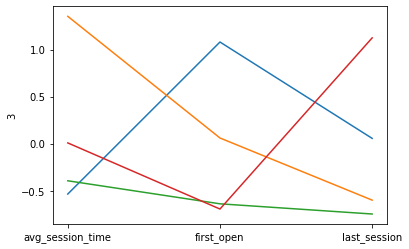

In [17]:
cluster_info = scaled_data.groupby(by='cluster').mean().copy()
fig = plt.figure()
for i in range(len(cluster_info)):
    sns.lineplot(x=cluster_info.columns[0:3], y=cluster_info.iloc[i, 0:3])

In [20]:
cluster_info.loc[:, ['avg_session_time', 'first_open', 'last_session']]= sc.inverse_transform(scaled_data.groupby(by='cluster').mean().iloc[:, 0:3].values)
cluster_info.loc[:, 'avg_session_time'] = np.exp(cluster_info['avg_session_time'])
cluster_info.loc[:, 'last_session'] = np.exp(cluster_info['last_session'])
cluster_info.head()

,avg_session_time,first_open,last_session,isPro
cluster,,,,
0,36.842170,171.168294,1.199467,0.044841
1,132.121481,116.797834,0.429596,0.112465
2,40.520424,79.513667,0.341097,0.046476
3,53.194544,76.559425,6.378033,0.032799


In [19]:
cluster_info.head()

,avg_session_time,first_open,last_session,isPro
cluster,,,,
0,36.842170,171.168294,1.199467,0.044841
1,132.121481,116.797834,0.429596,0.112465
2,40.520424,79.513667,0.341097,0.046476
3,53.194544,76.559425,6.378033,0.032799


In [24]:
user_data.sum()

user_id             2.216949e+13
sessions            1.082754e+06
last_session        6.870438e+04
total_eng_time      8.946591e+07
avg_session_time    1.406938e+06
last_interaction    5.195845e+04
first_open          2.340581e+06
obfuscatedId        2.216949e+13
isPro               1.136000e+03
dtype: float64